# Importing the required modules

In [1]:
# Modules used for data handling and visualisation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import random as r
sns.set_style("whitegrid")

# Modules used for suppressing warnings
import warnings 
warnings.filterwarnings('ignore')

# Modules used for dataset split
# import splitfolders
import os

# Modules used for model training and transfer learning
import tensorflow as tf
from tensorflow.keras.layers import Dense,Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras import Model

In [2]:
# Centering all the output images in the notebook.
from IPython.core.display import HTML as Center

Center(""" <style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style> """)

# Dataset Exploration

In [3]:
class Dataset:

    def __init__(self, dataset_path: str):
        self.PARENT = dataset_path
        self.class_distribution = dict()
    
    def __compute_class_distributions(self):
        for dirname in os.listdir(self.PARENT):
            full_path = os.path.join(self.PARENT, dirname)
            if not os.path.isdir(full_path):
                continue  # skip .DS_Store and other non-directory entries
            self.class_distribution[dirname] = len([
                f for f in os.listdir(full_path) if not f.startswith('.')
            ])

    def class_distributions(self):
        self.__compute_class_distributions()

        plt.figure(figsize=(10,10))
        plt.bar(self.class_distribution.keys(),
                self.class_distribution.values(),
                color=["crimson","red","orange","yellow"])
        plt.xticks(rotation=90)
        plt.title("Class Distribution of PlantVillage dataset")
        plt.xlabel("Class Label")
        plt.ylabel("Frequency of class")
        plt.show()

    def show_class_samples(self):
        # Only include actual directories (skips .DS_Store, etc.)
        class_dirs = sorted([
            d for d in os.listdir(self.PARENT)
            if os.path.isdir(os.path.join(self.PARENT, d))
        ])
        columns = 3
        rows = -(-len(class_dirs) // columns)  # ceiling division
        fig, axs = plt.subplots(rows, columns, figsize=(15, rows * 4))
        axs = axs.flatten()  # flatten to 1-D for easy indexing
        for c, dirname in enumerate(class_dirs):
            class_path = os.path.join(self.PARENT, dirname)
            imgs = [f for f in os.listdir(class_path) if not f.startswith('.')]
            if not imgs:
                continue
            img_path = r.choice(imgs)
            image = mpimg.imread(os.path.join(class_path, img_path))
            axs[c].imshow(image)
            axs[c].set_title(dirname, fontsize=7)
            axs[c].axis('off')
        # Hide any unused subplot slots
        for idx in range(len(class_dirs), len(axs)):
            axs[idx].set_visible(False)
        fig.suptitle("Image Samples of Plant Village dataset")
        plt.subplots_adjust(bottom=0.1, top=0.9, hspace=0.5)
        plt.show()


## Loading the dataset

In [4]:
plant_village = Dataset("train_val_test/train")

## Class Distribution

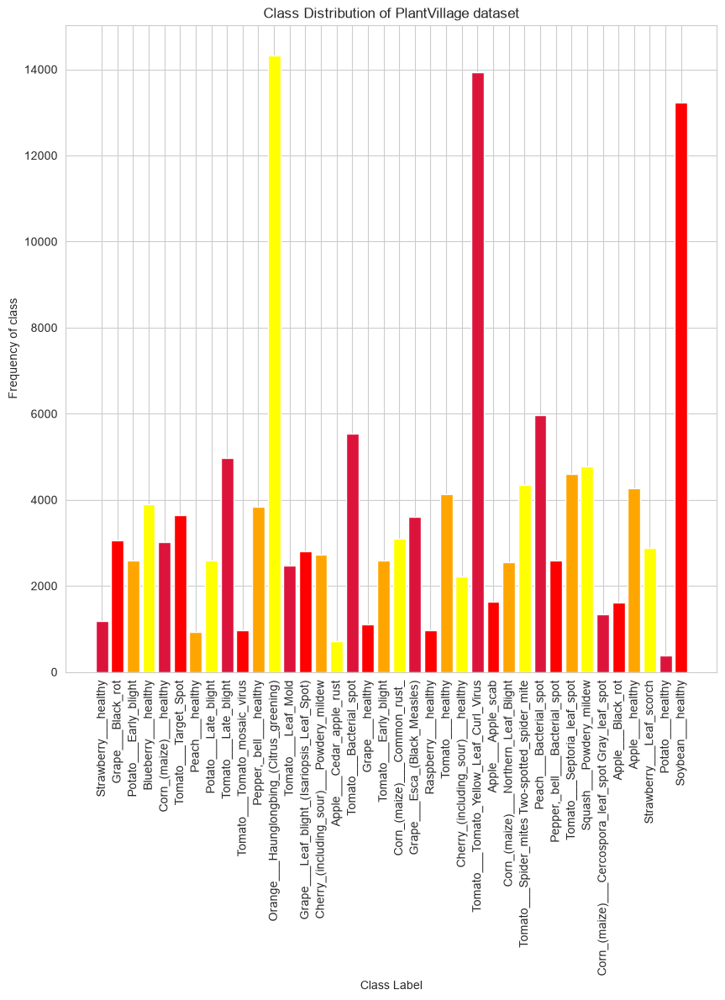

In [5]:
plant_village.class_distributions()

## Sample Images

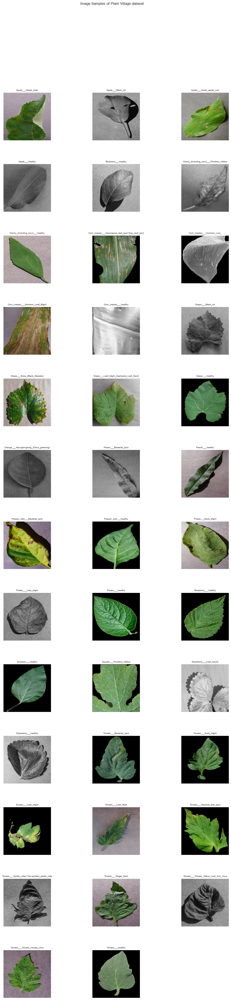

In [6]:
plant_village.show_class_samples()

# Train, Test, Validation Split

In [7]:

class DataSplit:

    def __init__(self, dataset_path: str, train_path: str, test_path: str, val_path: str) -> None:
        self.PARENT = dataset_path
        self.TRAIN_DIR = train_path
        self.TEST_DIR = test_path
        self.VAL_DIR = val_path
        self.train_gen = None
        self.test_gen = None
        self.val_gen = None

    def create_generators(self):
        self.train_gen = tf.keras.preprocessing.image.ImageDataGenerator(
            preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
        )

        self.test_gen = tf.keras.preprocessing.image.ImageDataGenerator(
            preprocessing_function=tf.keras.applications.resnet50.preprocess_input
        )

        self.val_gen =  tf.keras.preprocessing.image.ImageDataGenerator(
            preprocessing_function=tf.keras.applications.resnet50.preprocess_input
        )

    def get_images(self):
        train_images = self.train_gen.flow_from_directory(
            directory=self.TRAIN_DIR,
            target_size=(75, 75),
            color_mode='rgb',
            class_mode='categorical',
            batch_size=32,
            shuffle=True,
            seed=42,
            subset='training'
        )

        val_images = self.val_gen.flow_from_directory(
            directory=self.VAL_DIR,
            target_size=(75, 75),
            color_mode='rgb',
            class_mode='categorical',
            batch_size=32,
            shuffle=True,
            seed=42
        )

        test_images = self.test_gen.flow_from_directory(
            directory=self.TEST_DIR,
            target_size=(75, 75),
            color_mode='rgb',
            class_mode='categorical',
            batch_size=32,
            shuffle=False,
            seed=42
        )

        return train_images, val_images, test_images


In [8]:

ds = DataSplit("train_val_test", "train_val_test/train", "train_val_test/test", "train_val_test/val")


In [9]:
# ds.create_generators()

# train_images, val_images, test_images = ds.get_images()


## Train Data Insights

In [10]:
train = Dataset("train_val_test/train")

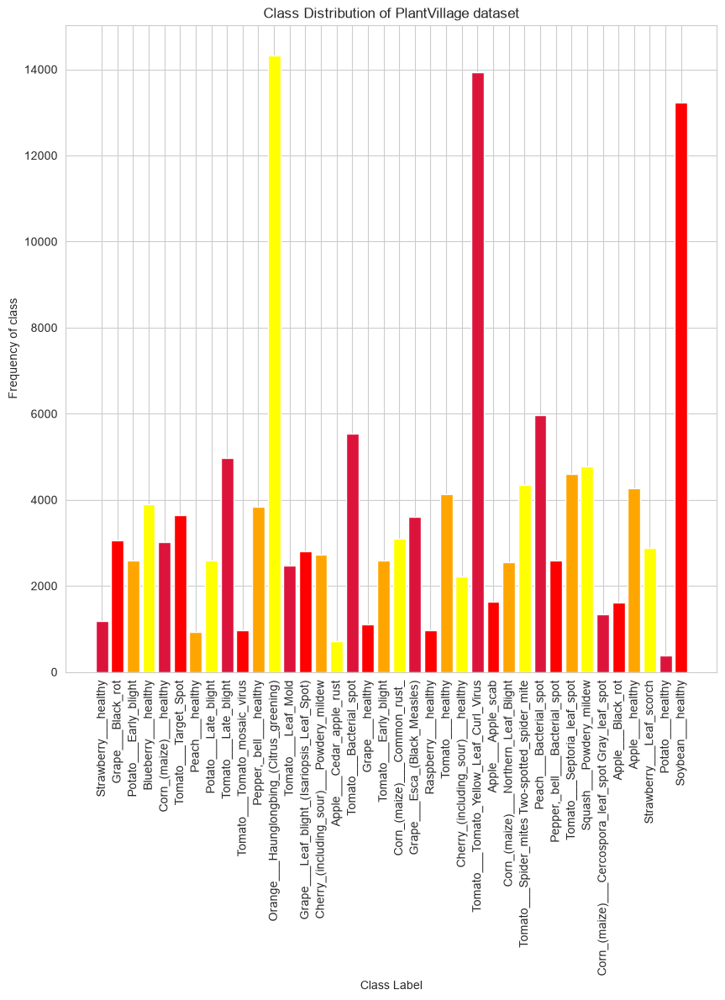

In [11]:
train.class_distributions()

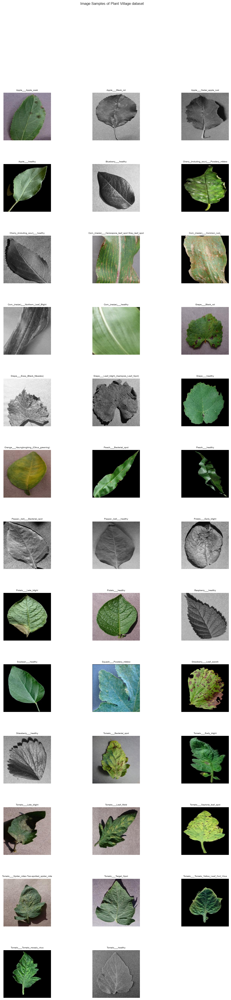

In [12]:
train.show_class_samples()

## Test Data Insights

In [13]:
test = Dataset("train_val_test/test")

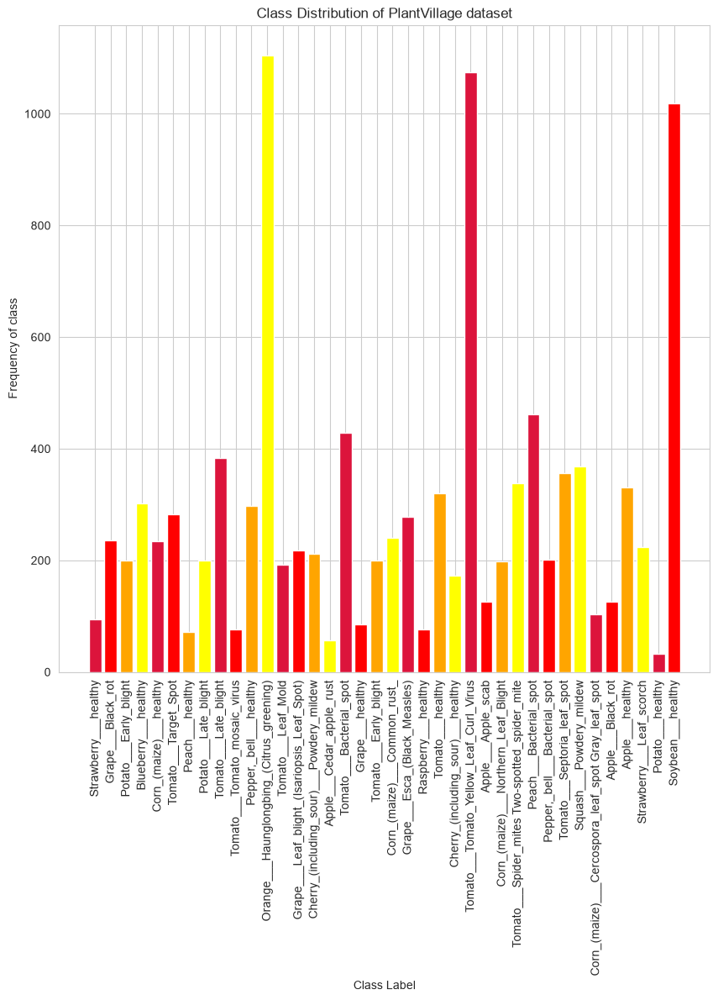

In [14]:
test.class_distributions()

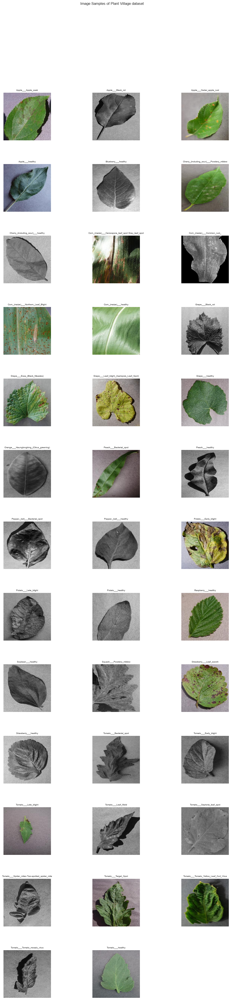

In [15]:
test.show_class_samples()

## Validation Data Insights

In [16]:
val = Dataset("train_val_test/val")

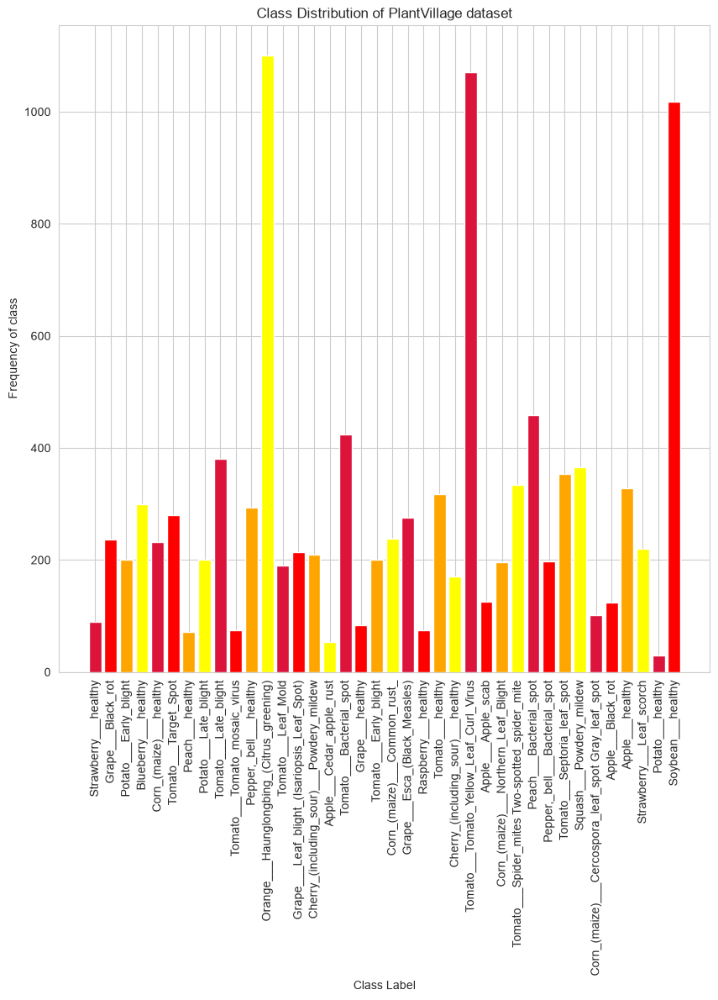

In [17]:
val.class_distributions()

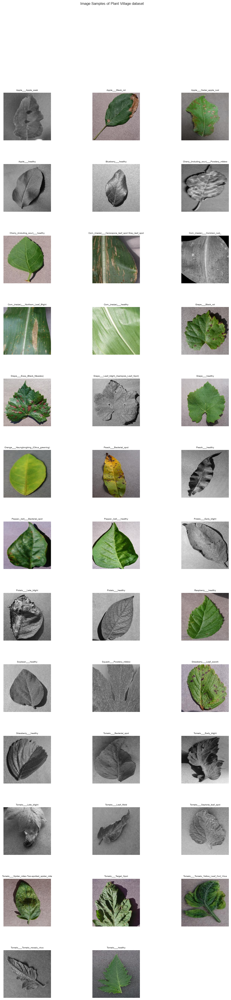

In [18]:
val.show_class_samples()

## Creating the data generators

In [19]:
ds.create_generators()

In [20]:
train, val, test = ds.get_images()

Found 141164 images belonging to 38 classes.
Found 10834 images belonging to 38 classes.
Found 10918 images belonging to 38 classes.


# Transfer Learning

In [21]:
class TransferLearning:

    def __init__(self, train, val) -> None:
        self.train = train
        self.val = val
        self.model = None
        self.history = None

    def load_model(self):
        self.model = ResNet50(weights = 'imagenet', 
                              include_top = False, 
                              input_shape = (75,75,3))
    
    def mark_layers_non_trainable(self):
        for layer in self.model.layers:
            layer.trainable = False
    
    def add_final_layer(self):
        self.x = Flatten()(self.model.output)
        self.x = Dense(1000, activation='relu')(self.x)
        self.predictions = Dense(38, activation = 'softmax')(self.x)

    def compile_model(self):
        self.model = Model(inputs = self.model.input, outputs = self.predictions)
        self.model.compile(optimizer='adam', loss="categorical_crossentropy", metrics=['accuracy'])
    
    def train_model(self):
        early_stop = tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=3,
            restore_best_weights=True
        )
        self.history = self.model.fit(self.train,
                                      batch_size=32,
                                      epochs=50, validation_data=self.val,
                                      callbacks=[early_stop])
    
    def plot_history(self):
        fig, axs = plt.subplots(2, 1, figsize=(15,15))
        axs[0].plot(self.history.history['loss'])
        axs[0].plot(self.history.history['val_loss'])
        axs[0].title.set_text('Training Loss vs Validation Loss')
        axs[0].set_xlabel('Epochs')
        axs[0].set_ylabel('Loss')
        axs[0].legend(['Train','Val'])

        axs[1].plot(self.history.history['accuracy'])
        axs[1].plot(self.history.history['val_accuracy'])
        axs[1].title.set_text('Training Accuracy vs Validation Accuracy')
        axs[1].set_xlabel('Epochs')
        axs[1].set_ylabel('Accuracy')
        axs[1].legend(['Train', 'Val'])

## Transfer Learning using Resnet50

In [22]:
tl = TransferLearning(train=train, val=val)

## Loading the Resnet50 from Keras Application

In [23]:
tl.load_model()

2026-08-27 19:25:09.968769: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M4
2026-08-27 19:25:09.968853: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2026-08-27 19:25:09.968868: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.92 GB
I0000 00:00:1787838909.969196 1046101 pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
I0000 00:00:1787838909.969477 1046101 pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


## Making all the layers of the model non-trainable

In [24]:
tl.mark_layers_non_trainable()

## Adding a final layer for classification of 38 classes

In [25]:
tl.add_final_layer()

## Compiling model

In [26]:
tl.compile_model()

## Training model

In [27]:
tl.train_model()

Epoch 1/50


2026-08-27 19:25:15.124007: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


4412/4412 ━━━━━━━━━━━━━━━━━━━━ 639s 143ms/step - accuracy: 0.7307 - loss: 13.3214 - val_accuracy: 0.8220 - val_loss: 13.3974
Epoch 2/50
4412/4412 ━━━━━━━━━━━━━━━━━━━━ 601s 136ms/step - accuracy: 0.8366 - loss: 14.3650 - val_accuracy: 0.8358 - val_loss: 20.0851
Epoch 3/50
4412/4412 ━━━━━━━━━━━━━━━━━━━━ 602s 136ms/step - accuracy: 0.8722 - loss: 14.6774 - val_accuracy: 0.8577 - val_loss: 21.8801
Epoch 4/50
4412/4412 ━━━━━━━━━━━━━━━━━━━━ 613s 139ms/step - accuracy: 0.8934 - loss: 14.0113 - val_accuracy: 0.8794 - val_loss: 24.6637


In [28]:
tl.model.save("models/first_model.h5")

In [29]:
CLASS_NAMES = list(train.class_indices.keys())
CLASS_NAMES

['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Blueberry___healthy',
 'Cherry_(including_sour)___Powdery_mildew',
 'Cherry_(including_sour)___healthy',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn_(maize)___Common_rust_',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Corn_(maize)___healthy',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_

In [30]:
from sklearn.metrics import accuracy_score, classification_report

In [31]:
predictions = np.argmax(tl.model.predict(test), axis=1)

342/342 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step


Test Accuracy: 82.433%


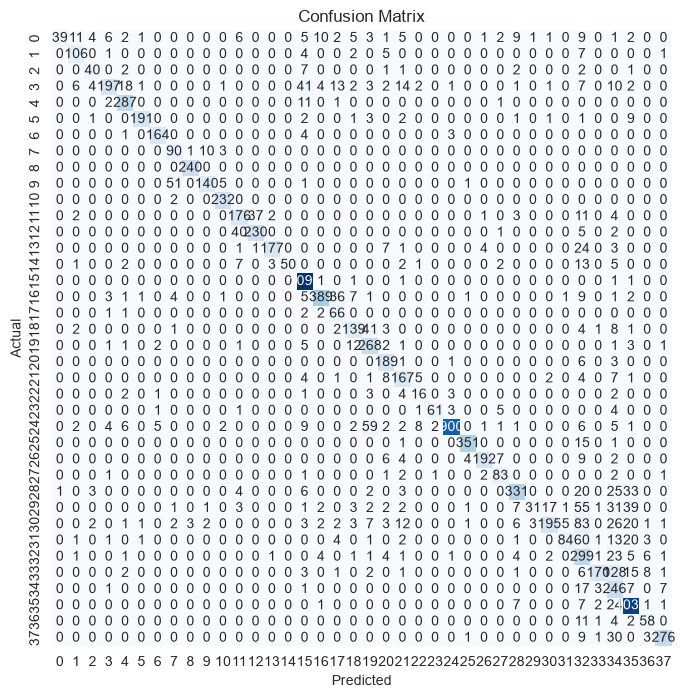

In [32]:
acc = accuracy_score(test.labels, predictions)
cm = tf.math.confusion_matrix(test.labels, predictions)
clr = classification_report(test.labels, predictions, target_names=CLASS_NAMES)

print("Test Accuracy: {:.3f}%".format(acc * 100))

plt.figure(figsize=(12, 12))
sns.heatmap(cm, annot=True, fmt='g', vmin=0, cmap='Blues', cbar=False)
plt.xticks(ticks= np.arange(len(CLASS_NAMES)) + 0.5, labels=CLASS_NAMES, rotation=90)
plt.yticks(ticks= np.arange(len(CLASS_NAMES)) + 0.5, labels=CLASS_NAMES, rotation=0)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [33]:
print(clr)

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.97      0.31      0.47       126
                                 Apple___Black_rot       0.80      0.84      0.82       126
                          Apple___Cedar_apple_rust       0.74      0.71      0.73        56
                                   Apple___healthy       0.90      0.60      0.72       330
                               Blueberry___healthy       0.88      0.95      0.91       302
          Cherry_(including_sour)___Powdery_mildew       0.97      0.90      0.94       212
                 Cherry_(including_sour)___healthy       0.95      0.95      0.95       172
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.60      0.87      0.71       104
                       Corn_(maize)___Common_rust_       0.98      1.00      0.99       240
               Corn_(maize)___Northern_Leaf_Blight       0.92      0.71      0.

## Plotting the Learning Curves

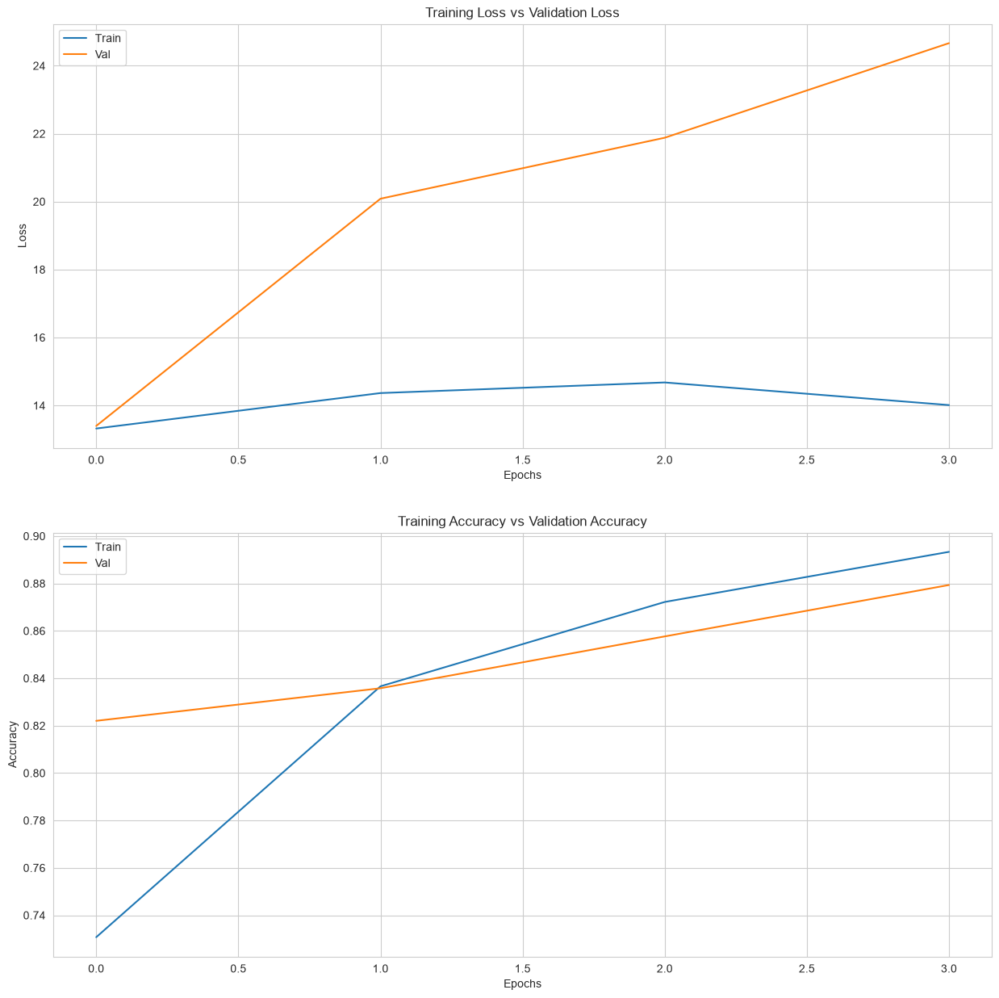

In [34]:
tl.plot_history()

- We can observe that model achieves an accuracy of 99.73% and 93.58% on training and validation sets respectively.
- Moreover, we can also gauge that the model is overfitting slightly which can be handled by fine tuning the model using regularization and re-training the layers

# Fine-tuning

Fine Tuning is the approach in which a pretrained model is used. However, few of the layers are made trainable to understand the patterns in the current dataset. Morevoer, regularization can also be added in the form of dropout layers.

In [35]:
class FineTuning:

    def __init__(self, train, val) -> None:
        self.train = train
        self.val = val
        self.model = None
        self.history = None
        self.fine_tune_from = 100

    def load_model(self):
        self.model = ResNet50(weights = 'imagenet', 
                              include_top = False, 
                              input_shape = (75,75,3))
    
    def fine_tune(self):
        for layer in self.model.layers[:self.fine_tune_from]:
            layer.trainable = False

        for layer in self.model.layers[self.fine_tune_from:]:
            layer.trainable = True
    
    def add_final_layer(self):
        self.x = Flatten()(self.model.output)
        self.x = Dense(1000, activation='relu')(self.x)
        self.predictions = Dense(38, activation = 'softmax')(self.x)

    def compile_model(self):
        self.model = Model(inputs = self.model.input, outputs = self.predictions)
        self.model.compile(optimizer='adam', loss="categorical_crossentropy", metrics=['accuracy'])
    
    def train_model(self):
        self.history = self.model.fit(train,
                                      batch_size=32, 
                                      epochs=10, 
                                      validation_data=val,
                                      callbacks=[
                                        tf.keras.callbacks.EarlyStopping(
                                            monitor='val_loss',
                                            patience=3,
                                            restore_best_weights=True
                                        )
                                     ])
    
    def plot_history(self):
        fig, axs = plt.subplots(2, 1, figsize=(15,15))
        axs[0].plot(self.history.history['loss'])
        axs[0].plot(self.history.history['val_loss'])
        axs[0].title.set_text('Training Loss vs Validation Loss')
        axs[0].set_xlabel('Epochs')
        axs[0].set_ylabel('Loss')
        axs[0].legend(['Train','Val'])

        axs[1].plot(self.history.history['accuracy'])
        axs[1].plot(self.history.history['val_accuracy'])
        axs[1].title.set_text('Training Accuracy vs Validation Accuracy')
        axs[1].set_xlabel('Epochs')
        axs[1].set_ylabel('Accuracy')
        axs[1].legend(['Train', 'Val'])

## Fine Tuning the ResNet50 model

In [36]:
ft = FineTuning(train,val)

## Loading the ResNet50 model from keras applications

In [37]:
ft.load_model()

## Making last 75 layers of the ResNet50 model trainable

In [38]:
ft.fine_tune()

## Adding a final layer for classification of 38 classes

In [39]:
ft.add_final_layer()

## Compiling the model

In [40]:
ft.compile_model()

## Training the model for 5 epochs

In [41]:
ft.train_model()

Epoch 1/10
4412/4412 ━━━━━━━━━━━━━━━━━━━━ 2032s 455ms/step - accuracy: 0.8305 - loss: 1.1704 - val_accuracy: 0.8810 - val_loss: 0.7501
Epoch 2/10
4412/4412 ━━━━━━━━━━━━━━━━━━━━ 2433s 551ms/step - accuracy: 0.8938 - loss: 1.2154 - val_accuracy: 0.9119 - val_loss: 1.2232
Epoch 3/10
4412/4412 ━━━━━━━━━━━━━━━━━━━━ 2442s 553ms/step - accuracy: 0.9263 - loss: 1.5542 - val_accuracy: 0.9055 - val_loss: 2.8037
Epoch 4/10
4412/4412 ━━━━━━━━━━━━━━━━━━━━ 2214s 502ms/step - accuracy: 0.9447 - loss: 1.4518 - val_accuracy: 0.9207 - val_loss: 3.2032


In [42]:
ft.model.save("models/second_model.h5")

In [43]:
predictions = np.argmax(ft.model.predict(test), axis=1)

342/342 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step


Test Accuracy: 89.146%


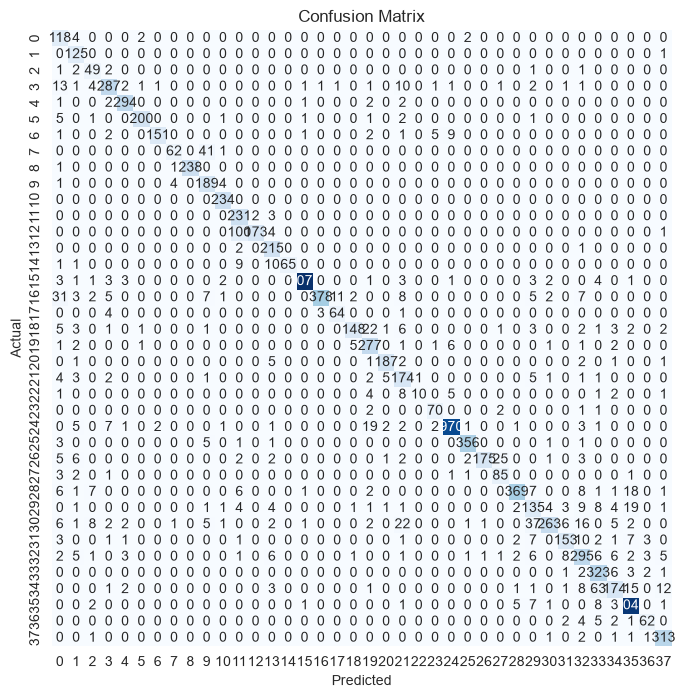

In [44]:
acc = accuracy_score(test.labels, predictions)
cm = tf.math.confusion_matrix(test.labels, predictions)
clr = classification_report(test.labels, predictions, target_names=CLASS_NAMES)

print("Test Accuracy: {:.3f}%".format(acc * 100))

plt.figure(figsize=(12, 12))
sns.heatmap(cm, annot=True, fmt='g', vmin=0, cmap='Blues', cbar=False)
plt.xticks(ticks= np.arange(len(CLASS_NAMES)) + 0.5, labels=CLASS_NAMES, rotation=90)
plt.yticks(ticks= np.arange(len(CLASS_NAMES)) + 0.5, labels=CLASS_NAMES, rotation=0)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


In [45]:
print(clr)

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.55      0.94      0.69       126
                                 Apple___Black_rot       0.75      0.99      0.85       126
                          Apple___Cedar_apple_rust       0.64      0.88      0.74        56
                                   Apple___healthy       0.90      0.87      0.88       330
                               Blueberry___healthy       0.95      0.97      0.96       302
          Cherry_(including_sour)___Powdery_mildew       0.98      0.94      0.96       212
                 Cherry_(including_sour)___healthy       0.98      0.88      0.93       172
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.91      0.60      0.72       104
                       Corn_(maize)___Common_rust_       1.00      0.99      1.00       240
               Corn_(maize)___Northern_Leaf_Blight       0.76      0.95      0.

## Evaluation of the fine-tuned model

In [46]:
ft.model.evaluate(test)

342/342 ━━━━━━━━━━━━━━━━━━━━ 37s 107ms/step - accuracy: 0.8915 - loss: 0.6539


[0.6538599729537964, 0.8914636373519897]

## Plotting the learning curves of the fine-tuning process

In [ ]:

ft.plot_history()

AttributeError: 'RecoveredModel' object has no attribute 'plot_history'

# Conclusion

- Transfer Learning is approach of using a model pretrained(i.e. ResNet50) on a large dataset(here, imagenet) and using its knowledge for our case.
- As inferred earlier, transfer learning gives an accuracy of 99.73% and 93.58% on training and validation sets respectively which shows that the model is slightly overfitted resulting in the requirement of fine tuning of the model.
- The model is fine tuned by letting the last 75 layers learn the patterns in the dataset and overcome the overfitting and improve the accuracy.
- The fine tuned model gives an accuracy of 98.75%, 95.42%, and 95.56% on train, validation, and test splits.
- On a final note, in the deep learning there is required of the large overhead of time and hardware requirements for Fine Tuning of the model.

In [11]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

# 1. Recreate the test data generator (runs instantly, no training)
test_gen = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input
)
test = test_gen.flow_from_directory(
    directory="train_val_test/test",
    target_size=(75, 75),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False,
    seed=42
)

# 2. Load your already-saved model from disk!
class RecoveredModel:
    pass

ft = RecoveredModel()
ft.model = tf.keras.models.load_model("models/second_model.h5")


Found 10918 images belonging to 38 classes.


2026-08-27 23:10:30.437490: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M4
2026-08-27 23:10:30.437538: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2026-08-27 23:10:30.437546: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.92 GB
I0000 00:00:1787852430.437847 1201881 pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
I0000 00:00:1787852430.438567 1201881 pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [12]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
import numpy as np



# Calculate predictions for Fine-Tuning Model
predictions_ft = np.argmax(ft.model.predict(test), axis=1)

# Calculate metrics for Fine-Tuning Model
acc_ft = accuracy_score(test.labels, predictions_ft)
recall_ft = recall_score(test.labels, predictions_ft, average='weighted')
precision_ft = precision_score(test.labels, predictions_ft, average='weighted')
f1_ft = f1_score(test.labels, predictions_ft, average='weighted')



2026-08-27 23:10:31.991648: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


342/342 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step


In [13]:
print("Accuracy: {:.9f}".format(acc_ft))
print("Precision: {:.9f}".format(precision_ft))
print("Recall: {:.9f}".format(recall_ft))
print("F1-score: {:.9f}".format(f1_ft))


Accuracy: 0.891463638
Precision: 0.905325995
Recall: 0.891463638
F1-score: 0.891500800
